## Imports

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from autogluon.tabular import TabularPredictor

In [2]:
#| echo: false
import os
os.chdir(os.path.expanduser('~/Dropbox/07-sld/2025-07-13-농진청'))
from IPython import get_ipython
import numpy as np
from IPython.lib.pretty import RepresentationPrinter

ip = get_ipython()
plain_formatter = ip.display_formatter.formatters['text/plain']

def float64_display(x, p: RepresentationPrinter, cycle):
    if isinstance(x, np.float64):
        # 소수점 6자리까지 깔끔하게 출력하고 싶다면 아래처럼
        p.text(f"{float(x):.6f}")
    else:
        # fallback: 기본 프린터 사용
        p.pretty(x)

# np.float64 타입에 대해 커스터마이징 적용
plain_formatter.for_type(np.float64, float64_display)

<function IPython.core.formatters.PlainTextFormatter._type_printers_default.<locals>.<lambda>(obj, p, cycle)>

## Titanic

The Titanic was a large passenger ship that departed from England in 1912. During its maiden voyage, the ship tragically collided with an iceberg and sank, resulting in the deaths of approximately 1,500 people. The film Titanic, directed by James Cameron in 1997, is a romance-disaster movie that tells a fictional love story set against the backdrop of this historical event. The movie portrays the grandeur of the ship, the social divide between the upper and lower classes, and the emotional turmoil of the characters as the disaster unfolds. It blends historical facts with imaginative storytelling to depict both the tragedy of the sinking and the intimate, human experiences that could have occurred during that fateful voyage.

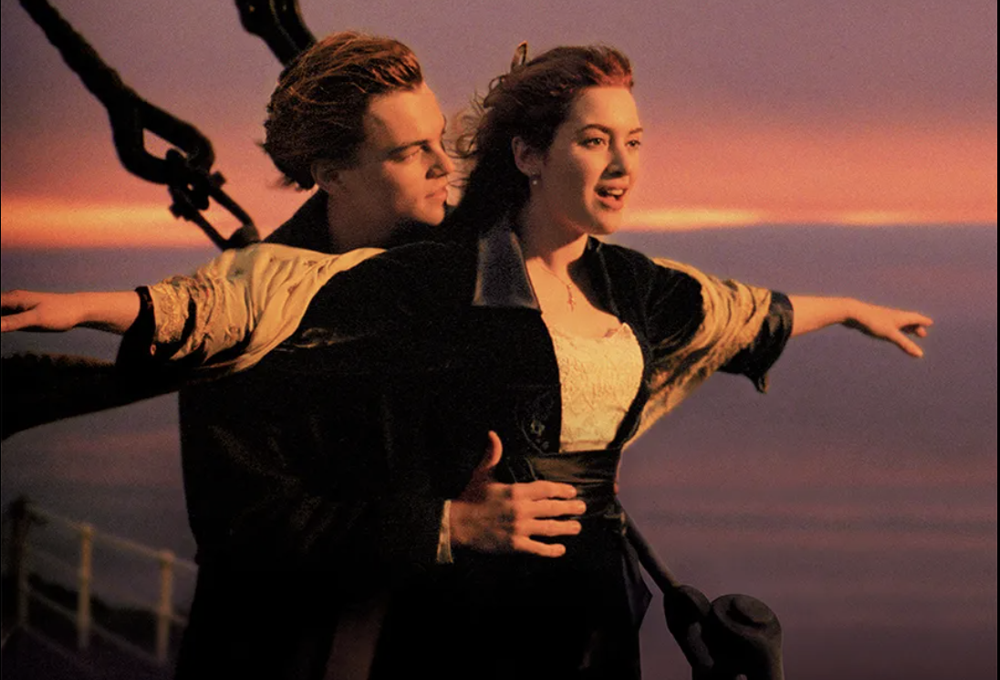

## The Story of Titanic

**Chapter 1. Jack and Rose Board the Ship**

The movie Titanic starts with two people from very different lives.
Jack Dawson gets a Titanic ticket by chance when he plays a card game with his friend on the day the ship leaves.
He runs to the dock and gets on the ship just before it leaves.
His ticket is for third class, which is the cheapest.

<https://www.youtube.com/watch?v=tEM0I3ltp7M>

Rose DeWitt Bukater is already on the ship at the beginning of the movie.
She gets on the Titanic with her boyfriend Cal and her mother. They are rich and get special treatment.
Rose wears fancy clothes, eats expensive food, and stays in a beautiful room. But she feels trapped and unhappy.

<https://www.youtube.com/watch?v=3uCi1g_aV-g>


---

**Chapter 2. They Fall in Love**

Jack and Rose meet on the ship.
Jack saves Rose when she is in danger.
They talk, laugh, and spend time together.
Soon, they fall in love.

<https://www.youtube.com/watch?v=erAQ9LkftwA>

<https://www.youtube.com/watch?v=oklPl95DC8c>

---

**Chapter 3. The Sinking and the Divided Paths**

When the Titanic strikes the iceberg, chaos begins to unfold.
But this chaos is not delivered equally to everyone on board.

In the film, a clear difference is shown between first-class and third-class passengers.
First-class passengers are quickly and politely informed by crew members.
They receive calm explanations, are given life jackets, and are carefully guided toward the lifeboats.
They are seen dressing in formal clothes and preparing for evacuation in an orderly manner.

Meanwhile, third-class passengers go a long time without any information about the accident.
Many find the stairways and corridors blocked, unable to reach the upper decks.
Families wander the ship in confusion, and others wait helplessly behind locked gates—
a powerful image of the class-based gap in access to survival.

Amid the growing panic, Rose’s fiancé, Cal, begins to search for her.
As a wealthy gentleman, he urges Rose to get on a lifeboat and escape with him.

<https://www.youtube.com/watch?v=Gmw1q0CprEA>

---

**Chapter 4. The Lifeboat Scene**

Cal tells Rose to get on a lifeboat.
She agrees at first and is lowered away from Jack.

But as the boat goes down, Rose looks up at him.
She suddenly jumps back onto the ship.
She chooses to stay with Jack, even if it means risking her life.

Jack and Rose run through the sinking ship together.
They try to find a way out as water floods the halls.
Their love becomes stronger in the face of fear.

<https://www.youtube.com/watch?v=_qTZRD1_ybQ>

---

**Chapter 5. The End and the Memory**

As the Titanic sinks deeper into the sea,
Jack and Rose struggle to survive together until the very end.
They cling to a broken piece of wood, floating in the freezing ocean.

Jack protects Rose and says,
“Never give up. Never let go.”
Rose holds his promise deep in her heart.

When a lifeboat finally arrives, Rose is rescued.
But Jack quietly slips into the cold water and disappears.

Later, on the lifeboat, a rescuer asks for her name.
She answers, “Rose Dawson.”


<https://www.youtube.com/watch?v=D7_SqyWiPOg>

## Titanic Dataset

The Titanic dataset is a standard, real-world dataset that contains information about the passengers aboard the RMS Titanic, which sank in 1912.
It is widely used as a classic resource for practicing machine learning, statistical analysis, and data visualization.

The Titanic dataset is commonly provided as a CSV file named titanic.csv,
and can be obtained from various sources such as Kaggle, the seaborn package, or scikit-learn.
We can load this data using the pandas library in Python.



---

The Titanic data can be loaded as follows:

In [56]:
df = pd.read_csv("titanic.csv")
df

,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
0,1,0,3,"Braund, Mr. Owen Harris",male,22.0,1,0,A/5 21171,7.2500,NaN,S
1,2,1,1,"Cumings, Mrs. John Bradley (Florence Briggs Thayer)",female,38.0,1,0,PC 17599,71.2833,C85,C
2,3,1,3,"Heikkinen, Miss. Laina",female,26.0,0,0,STON/O2. 3101282,7.9250,NaN,S
3,4,1,1,"Futrelle, Mrs. Jacques Heath (Lily May Peel)",female,35.0,1,0,113803,53.1000,C123,S
4,5,0,3,"Allen, Mr. William Henry",male,35.0,0,0,373450,8.0500,NaN,S
...,...,...,...,...,...,...,...,...,...,...,...,...
886,887,0,2,"Montvila, Rev. Juozas",male,27.0,0,0,211536,13.0000,NaN,S
887,888,1,1,"Graham, Miss. Margaret Edith",female,19.0,0,0,112053,30.0000,B42,S
888,889,0,3,"Johnston, Miss. Catherine Helen ""Carrie""",female,NaN,1,2,W./C. 6607,23.4500,NaN,S
889,890,1,1,"Behr, Mr. Karl Howell",male,26.0,0,0,111369,30.0000,C148,C


---

In this code, `pd.read_csv("titanic.csv")` means
reading the file `titanic.csv` from the current working directory,
and storing its contents into a variable named df as a DataFrame object.

- `pd` is a commonly used alias for the pandas package, which is typically imported using import pandas as pd.
- `read_csv()` is a function that reads data from a CSV (Comma-Separated Values) file and converts it into a pandas DataFrame, a tabular data structure.

This allows users to import structured data in table format and perform various kinds of analysis on it.

---

When working with data in pandas,the very first thing to check after loading a dataset is its overall structure.
The most basic command used for this purpose is:

In [4]:
df.shape

(891, 12)

Running this code returns the output (891, 12), which indicates that the DataFrame contains 891 rows and 12 columns. In this context, each row represents a single observation — in this case, an individual passenger on the Titanic.
Each column represents a variable that describes a certain feature of the passenger,
such as Age, Sex, Pclass, or Survived.

To explicitly show what variables are included in the dataset,
it is helpful to inspect the column names directly.
This can be done using the following command:

In [5]:
df.columns

Index(['PassengerId', 'Survived', 'Pclass', 'Name', 'Sex', 'Age', 'SibSp',
       'Parch', 'Ticket', 'Fare', 'Cabin', 'Embarked'],
      dtype='object')

---

:::{.callout-tip}

**Useful pandas Commands for Exploring Data Structure**

Using commands like `df.shape` or `df.columns` to explore the structure of a dataset is a fundamental first step in any data analysis workflow.
These commands help you understand what the data looks like, how many variables it contains, and how it’s organized.
Below are some of the most useful pandas functions for this purpose:

- `df.shape`: Returns the overall dimensions of the DataFrame as a tuple (rows, columns). This helps you quickly understand how many observations (rows) and variables (columns) the dataset contains.
- `df.columns`: Displays a list of all column names in the DataFrame.
This allows you to explicitly check what variables are included.
- `df.info()`: Provides a concise summary of the DataFrame, including data types of each column, the number of non-null entries, and memory usage. It is especially useful for detecting missing values and distinguishing between numeric and categorical variables.
- `df.head()` / `df.tail()`: Shows the first (or last) few rows of the dataset.
This gives you a quick preview of actual values, formatting, and data units, making it easier to get a sense of how the data is structured.
- `df.describe()`: Generates summary statistics for numeric columns, including mean, standard deviation, minimum, maximum, and quartiles. It helps in identifying variable scales, distributions, and potential outliers early in the analysis.
:::

---

Understanding this basic structure is an essential first step in any data analysis process.
If there are too few rows, statistical results may not be reliable.
On the other hand, if there are too many columns or if the data contains many missing values,
preprocessing and feature selection may become more complex.

From this output, we can see that the Titanic dataset includes
891 passengers and 12 variables,
making it well-suited for analysis and practice in tasks such as classification, exploration, and visualization.

:::{.callout-note}

**Conventional meaning of rows and columns**

- Row: Represents a single observation or instance. For example, in the Titanic dataset, each row corresponds to one passenger.
- Column: Represents a variable or feature that describes a specific aspect of each observation. For example, Age, Sex, and Survived are variables that describe the characteristics of each passenger.
:::

## Variables in the Titanic Dataset

:::{.small style="font-size: 0.9em;"}
| **Variable** | **Description** |
|--------------|-----------------|
| `PassengerId` | Unique ID for each passenger. |
| `Survived`    | Survival status (0 = No, 1 = Yes). |
| `Pclass`      | Ticket class (1 = 1st, 2 = 2nd, 3 = 3rd). |
| `Name`        | Full name, includes title. |
| `Sex`         | Gender (`male` or `female`). |
| `Age`         | Age in years (may have missing values). |
| `SibSp`       | Number of siblings or spouses aboard. |
| `Parch`       | Number of parents or children aboard. |
| `Ticket`      | Ticket number. |
| `Fare`        | Ticket fare (in pounds). |
| `Cabin`       | Cabin number (many missing). |
| `Embarked`    | Embarked shows boarding port: C (Cherbourg), Q (Queenstown), S (Southampton). |

: {tbl-colwidths="[12,88]"}
:::

## Sample Observations from the Titanic Dataset

After loading the data, it is a good practice to print a few rows to understand how the dataset is structured.

In [6]:
df[:3]

,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
0,1,0,3,"Braund, Mr. Owen Harris",male,22.0,1,0,A/5 21171,7.2500,NaN,S
1,2,1,1,"Cumings, Mrs. John Bradley (Florence Briggs Th...",female,38.0,1,0,PC 17599,71.2833,C85,C
2,3,1,3,"Heikkinen, Miss. Laina",female,26.0,0,0,STON/O2. 3101282,7.9250,NaN,S


Using the command `df[:3]`, we can view the first three observations in the Titanic DataFrame.

For example, the first passenger is a 22-year-old male in 3rd class who boarded at Southampton and did not survive.
The second passenger is a 38-year-old female in 1st class with cabin C85. She boarded at Cherbourg and survived.
The third passenger is a 26-year-old female in 3rd class who also boarded at Southampton and survived.

## Supervised vs. Unsupervised: Choosing a Path

Now that we’ve reviewed a few sample observations and understood the structure of the dataset, it’s time to consider what we can actually do with this data.

The Titanic dataset allows for various types of analysis.
For example, one could explore relationships between variables and discover hidden patterns using unsupervised learning.
Alternatively, since the dataset includes a clear outcome variable (Survived), we can apply supervised learning to build predictive models.

In today’s lecture, we will focus on supervised learning.
Our goal is to use features like gender, age, passenger class, and port of embarkation
to predict whether a passenger survived the Titanic disaster.

## Training Set vs Test Set

Before building any predictive model, we first need to split our dataset into two parts: a training set and a test set.

- The training set (`df_train`) is used to train the model. It learns patterns from this data, including how certain features relate to survival.
- The test set (`df_test`) is used to evaluate how well the model performs on new, unseen data. This helps us assess generalization, not just memorization.

By separating our data this way, we can simulate how our model would behave in real-world scenarios — predicting survival outcomes for passengers it hasn’t seen before. In practice, we can use the `train_test_split()` function from `sklearn`.

---

In our case, we used `train_test_split(df, test_size=0.3, random_state=42)` to split the Titanic dataset.
This means that 70% of the data (712 passengers) is used for training, while the remaining 30% (179 passengers) is reserved for testing.

In [7]:
df_train, df_test = train_test_split(df, test_size=0.2, random_state=42)
df_test = df_test.drop(["Survived"],axis=1)


After splitting, we removed the Survived column from the test set using `df_test = df_test.drop(["Survived"], axis=1)` to simulate real-world prediction, where the correct answer is unknown.

::: {.callout-tip title="Code Explanation"}
Here’s a quick explanation of the main options used.

- `test_size=0.2`: 20% of the data goes into the test set, and 80% into the training set.
- `random_state=42`: Ensures that the random split is reproducible every time.
- `.drop(["Survived"], axis=1)`: Removes the `Survived` column from `df_test`.  
  `axis=1` means "drop a column" (not a row).
:::

---

To confirm that the data has been properly split, we can check the shape of each DataFrame using the following command:

In [8]:
df.shape, df_train.shape, df_test.shape

((891, 12), (712, 12), (179, 11))

This result can be interpreted as follows:

- (891, 12): The full DataFrame df contains 891 observations (rows) and 12 variables (columns).
- (712, 12): After using train_test_split(), 80% of the data — 712 rows — was assigned to the training set df_train, which still contains all 12 columns.
- (179, 11): The test set df_test contains the remaining 20% — 179 rows — but since we explicitly dropped the Survived column, the number of columns is reduced to 11.

---

After splitting the data using `train_test_split()`, we can check the first few rows of each subset to verify how the data was divided.

For instance, when we look at `df_train[:2]`, we can see that the first two rows of the training set correspond to rows with original indices 331 and 733 from the full dataset df.

In [9]:
df_train[:2]

,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
331,332,0,1,"Partner, Mr. Austen",male,45.5,0,0,113043,28.5,C124,S
733,734,0,2,"Berriman, Mr. William John",male,23.0,0,0,28425,13.0,NaN,S


Similarly, `df_test[:2]` shows rows from the original dataset with indices 709 and 439.

In [10]:
df_test[:2]

,PassengerId,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
709,710,3,"Moubarek, Master. Halim Gonios (""William George"")",male,NaN,1,1,2661,15.2458,NaN,C
439,440,2,"Kvillner, Mr. Johan Henrik Johannesson",male,31.0,0,0,C.A. 18723,10.5000,NaN,S


Note that the Survived column has been removed.

---

![Figure: This illustration visually explains the structure of df_train and df_test for easier understanding. The training set (`df_train`) includes the Survived information, while the test set (`df_test`) does not. This image was generated using Perplexity.](figs/48d01a20-ff40-45ae-8ac6-4a64e02f8b1f.png)

---

We assume that the observed data consists of `df_train` and `df_test`.
We use df_train for training.
The goal of training is to correctly predict the survival status when given new data like `df_test`.
If we have studied `df_train` carefully, we should be able to guess whether the following two passengers survived or not.

In [11]:
df_test[:5]

,PassengerId,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
709,710,3,"Moubarek, Master. Halim Gonios (""William George"")",male,NaN,1,1,2661,15.2458,NaN,C
439,440,2,"Kvillner, Mr. Johan Henrik Johannesson",male,31.0,0,0,C.A. 18723,10.5000,NaN,S
840,841,3,"Alhomaki, Mr. Ilmari Rudolf",male,20.0,0,0,SOTON/O2 3101287,7.9250,NaN,S
720,721,2,"Harper, Miss. Annie Jessie ""Nina""",female,6.0,0,1,248727,33.0000,NaN,S
39,40,3,"Nicola-Yarred, Miss. Jamila",female,14.0,1,0,2651,11.2417,NaN,C


---

Answer revealed… (Though in practice, we wouldn’t actually know the answer)

In [12]:
df.iloc[df_test[:5].index]

,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
709,710,1,3,"Moubarek, Master. Halim Gonios (""William George"")",male,NaN,1,1,2661,15.2458,NaN,C
439,440,0,2,"Kvillner, Mr. Johan Henrik Johannesson",male,31.0,0,0,C.A. 18723,10.5000,NaN,S
840,841,0,3,"Alhomaki, Mr. Ilmari Rudolf",male,20.0,0,0,SOTON/O2 3101287,7.9250,NaN,S
720,721,1,2,"Harper, Miss. Annie Jessie ""Nina""",female,6.0,0,1,248727,33.0000,NaN,S
39,40,1,3,"Nicola-Yarred, Miss. Jamila",female,14.0,1,0,2651,11.2417,NaN,C


::: {.callout-tip title="Code Explanation"}

The code `df.iloc[df_test[:2].index]` retrieves the original rows (including the Survived column) for the first two passengers in `df_test`.

- `df_test[:2]` selects the first two rows from the test set.
- `.index` extracts their original row positions from the full DataFrame `df`.
- `df.iloc[...]` uses these positions to return the corresponding rows from `df`, including the true labels.

:::

Let’s play a game: try to guess who survived the Titanic!

## Titanic Predictor: No ML, Just Guess

Do you remember that iconic scene from Titanic—when Rose boards the lifeboat? Rose is seated in the lifeboat, looking up at Jack and Cal who are still on the ship’s deck. Jack stands silently, watching her leave, while other passengers around them reflect the chaos of the moment. Though no words are spoken, their eyes are locked, full of emotion. 

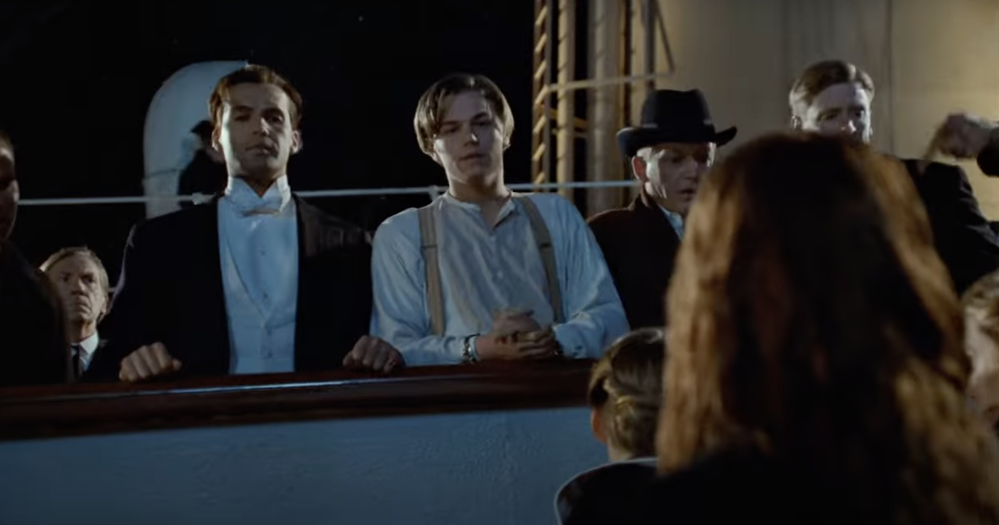

---

From her place in the lifeboat, Rose gazes up at the deck. Her expression is filled with uncertainty and longing as she looks toward Jack. The moment captures the emotional weight of her decision. Soon after, driven by love and instinct, Rose jumps out of the lifeboat and runs back to the sinking ship—a choice that defines one of the most iconic scenes in the film.

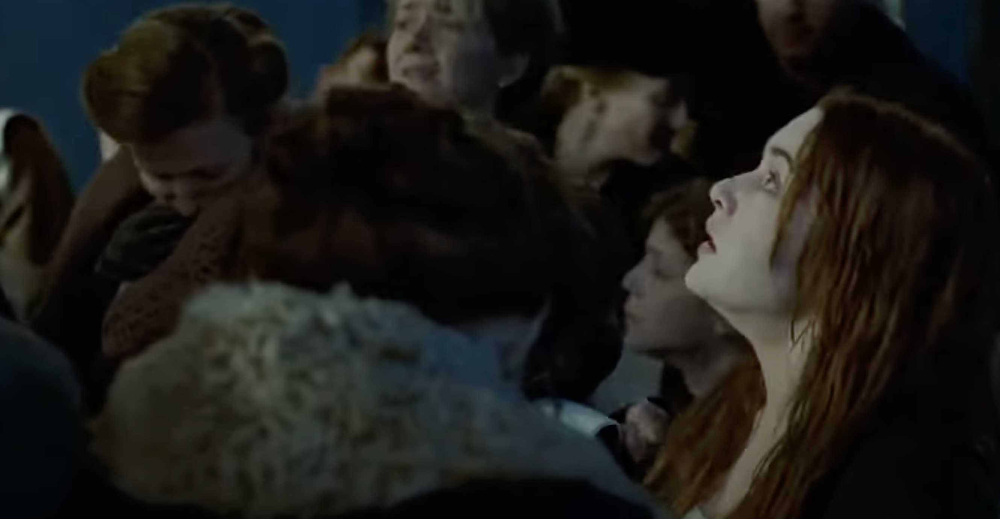

---


These scenes may be emotionally powerful, but let’s set aside the emotion for a moment and look at them objectively.

Who is on the lifeboat?
We see Rose and several other women being rescued.

Who remains on the deck?
Jack and other men are watching the lifeboats leave from the sinking ship.

This contrast raises an important question:

> Was gender a factor in determining who had a better chance of survival?

Let’s turn to the data to explore this further.

---

To analyze the impact of gender on survival outcomes, we use the following code to compute survival rates by sex.

In [13]:
df_train.groupby("Sex")['Survived']

::: {.callout-tip title="Code Explanation"}

This command does the following:

- `groupby("Sex")`: groups the passengers by their gender (male or female)
- `['Survived'].mean()`: calculates the average survival rate for each group
(since 1 = survived, 0 = did not survive, the mean gives the survival proportion)
- `.reset_index()`: turns the grouped result back into a clean DataFrame

The result shows how survival rates differ dramatically between males and females. Let’s look at the numbers.

:::

---

This output shows the average survival rate by gender.

- For females, the survival rate is approximately 73.9%.
- For males, it’s about 18.6%.

In other words, just knowing the passenger’s gender already gives us a strong signal about their likelihood of survival. A variable like this, with a clear split in outcomes, can be very useful in building predictive models. Based on this result, we can try a simple rule-based prediction: Predict that all females survived (1), and all males did not survive (0). Let’s test how accurate this strategy actually is.

---

In this analysis, the goal is to predict survival status.
The variable we are trying to predict is called the response variable (or dependent variable),
which in this case is:

In [14]:
y_test = df.iloc[df_test.index]['Survived']

This gives us a vector of length 179 containing actual survival outcomes from the test set: 0 means the passenger did not survive, and 1 means they did. On the other hand, the variable we use to make predictions is called the explanatory variable (or independent variable).
Here, we use the Sex column and apply a simple rule:

In [15]:
yhat_test = (df_test['Sex']  == "female")

This creates a Boolean vector that predicts survival based on whether the passenger is female. So in summary:

- `y_test` is the response variable — the true survival outcomes.
- `yhat_test` is based on an explanatory variable — a simple prediction using gender.


---


By comparing `yhat_test` and `y_test` using `(yhat_test == y_test).mean()`, we calculate the accuracy of our prediction, which tells us how informative the Sex variable is for predicting survival.

In [16]:
(yhat_test == y_test).mean()

0.782123

The result shows an accuracy of approximately 78.2%, which is a significant improvement over random guessing (which would yield about 50% accuracy). This demonstrates that even a simple rule based solely on the “Sex” variable can produce surprisingly strong predictions — all without using any machine learning.

---

Let’s go back to the movie for a moment.
Was it really just

> "women first"?

In situations like this, we often expect the most vulnerable — women and children — to be given priority. Even the film hints at this principle. Now let’s take a closer look at the data to see whether younger passengers were also more likely to survive.

<https://www.youtube.com/watch?v=W0kURU_2H3c>

---

The overall survival rate among all passengers was only about 37.6%, meaning that less than half of the people on board survived the disaster. 

In [17]:
df_train['Survived'].mean()

0.376404

But what about children?

In [18]:
df_train.query("Age <10")['Survived'].mean()

0.603774

When we look specifically at passengers under the age of 10, their survival rate rises significantly to about 60.4%. This suggests that younger passengers were indeed given some level of priority during evacuation, supporting the idea portrayed in the film — that the principle of “women and children first” may have been reflected in real-life decisions during the sinking.

---

:::{.callout-tip title="Code Explanation"}

The following code filters the DataFrame to include only rows where the Age column is less than 10.

```Python
df_train.query("Age < 10")
```

The `query()` method allows you to write filtering conditions as strings, making the code clean and easy to read.

For example:

- `df.query("Fare > 100")` → selects passengers who paid more than 100
- `df.query("Sex == 'female'")` → selects female passengers

You can also combine multiple conditions:

```Python
df.query("Pclass == 1 and Sex == 'female'")
```

`query()` is a convenient and readable way to filter data based on conditions.
:::

::: {.scrollable}


---

The plot below visualizes the age distribution of passengers based on their survival status. The blue area shows the age distribution of those who survived, while the red area represents those who did not. Notably, children under the age of 10 show a relatively higher survival rate, supporting the idea that the “women and children first” principle may have been applied during the evacuation.

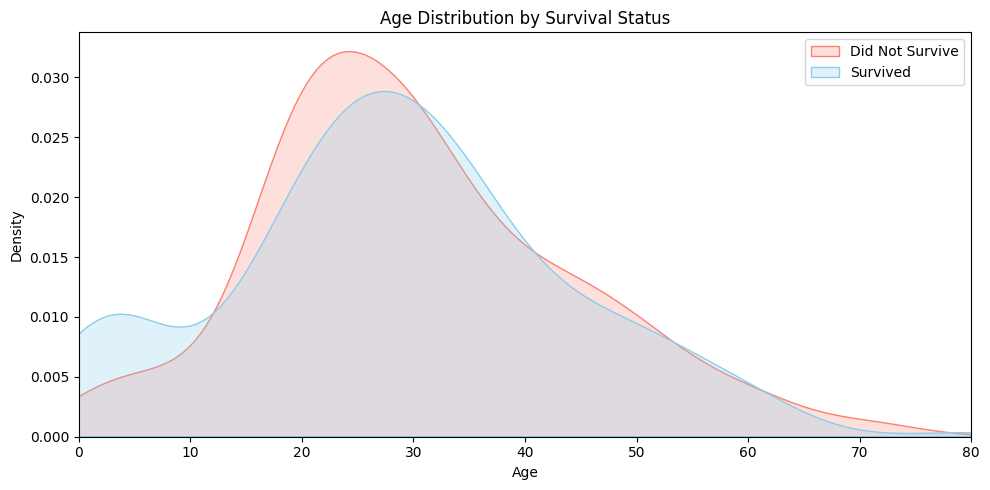

In [19]:
#| echo: true
#| code-fold: true
#| code-scroll: true
#| fig-cap: "Figure: Survival Rate by Age Distribution"

fig, ax = plt.subplots(figsize=(10, 5))

# 공통 X축 범위 설정
x_range = (0, 80)

# KDE plot for survived == 0 and 1
sns.kdeplot(data=df_train[df_train.Survived == 0], x="Age", fill=True, label="Did Not Survive", color="salmon")
sns.kdeplot(data=df_train[df_train.Survived == 1], x="Age", fill=True, label="Survived", color="skyblue")

ax.set_xlim(x_range)
ax.set_title("Age Distribution by Survival Status")
ax.set_xlabel("Age")
ax.set_ylabel("Density")
ax.legend()

plt.tight_layout()
plt.show()

:::


---

Now let’s try a new prediction strategy:

- If the passenger is female, predict that they survived.
- If the passenger is under 10 years old, also predict that they survived.



In [20]:
y_test = df.iloc[df_test.index]['Survived']
yhat_test = (df_test['Sex']  == "female") | (df_test['Age'] < 10)

Now let’s compare `y_test` and `yhat_test` to evaluate the prediction accuracy:

In [21]:
(y_test == yhat_test).mean()

0.787709

This strategy yields an accuracy of 0.787709, or about 78.8%.
That’s a slight improvement over using only the sex variable, which gave an accuracy of 78.2%.

---

The improvement isn’t as dramatic as one might expect. Why is that?

It turns out that there aren’t many passengers under the age of 10 in the test set.
The only time our prediction rule changes (compared to using gender alone) is when a passenger is male and under 10 — but such cases are rare. If we check the data:

In [22]:
df_test.query("Sex == 'male' and Age < 10")

,PassengerId,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
63,64,3,"Skoog, Master. Harald",male,4.00,3,2,347088,27.900,NaN,S
165,166,3,"Goldsmith, Master. Frank John William ""Frankie""",male,9.00,0,2,363291,20.525,NaN,S
78,79,2,"Caldwell, Master. Alden Gates",male,0.83,0,2,248738,29.000,NaN,S


We find that there are only 3 such passengers in the test set. That’s why the gain is modest. It’s a bit disappointing, but even so, we can be reasonably satisfied with the small improvement that age provides.

## Generalization

So far, we’ve seen that gender and age played an important role in survival.
But are those the only factors that mattered?

Think back to that unforgettable scene from the film:
First-class passengers are calmly escorted to the lifeboats by the crew,
while third-class passengers remain behind locked gates, confused and unable to escape.
This isn’t just cinematic drama — it raises an important question:

> Did survival also depend on ticket class or fare price?

Let’s explore the data further to find out.

---

This code calculates the average survival rate by passenger class (Pclass):

In [23]:
df_train.groupby("Pclass")['Survived'].mean().reset_index()

,Pclass,Survived
0,1,0.607362
1,2,0.483444
2,3,0.241206


The output shows the following survival rates:

- 1st class (Pclass = 1): approximately 60.7%
- 2nd class (Pclass = 2): approximately 48.3%
- 3rd class (Pclass = 3): approximately 24.1%

In other words, passengers in higher classes had a much better chance of survival. This aligns with scenes from the movie, where first-class passengers were often prioritized during evacuation. The data suggests that passenger class (Pclass) is a strong explanatory variable when predicting survival on the Titanic.

---

The prediction based solely on passenger class (predicting survival if Pclass == 1) achieves an accuracy of approximately 70.4%.

In [24]:
y_test = df.iloc[df_test.index]['Survived']
yhat_test = (df_test['Pclass'] == 1) 
(yhat_test == y_test).mean()

0.703911

While this result is quite good, it falls short of the 78.2% accuracy obtained when predicting based solely on gender (predicting survival if Sex == "female").

This suggests that gender is a stronger explanatory variable than passenger class when it comes to predicting survival on the Titanic. In other words, knowing someone’s gender gives us more predictive power than knowing their ticket class alone.

---

Could we consider both gender and passenger class together? Doing so may reveal more detailed and accurate survival patterns.

In [25]:
df_train.groupby(["Sex","Pclass"])["Survived"].mean().reset_index()

,Sex,Pclass,Survived
0,female,1,0.957143
1,female,2,0.966667
2,female,3,0.486957
3,male,1,0.344086
4,male,2,0.164835
5,male,3,0.141343


For example, female passengers in 1st class had a survival rate of about 95.7%, while male passengers in 3rd class had a survival rate of only 14.1%. These stark contrasts show that the combination of gender and class provides a much stronger signal than either variable alone. In short, considering both Sex and Pclass together gives us a more powerful strategy for predicting survival.

---

So, let’s design a prediction rule based on the survival rates we just observed.
We saw that:

- Women in 1st and 2nd class had very high survival rates.
- Men in 2nd and 3rd class had very low survival rates.
- The more ambiguous cases were female passengers in 3rd class and male passengers in 1st class, but even those had survival rates below 50%.

Given this, a reasonable strategy would be:

> Predict survived only if the passenger is female and in 1st or 2nd class. Otherwise, predict not survived.


---

Here’s how we can implement this in code:


In [26]:
yhat_test = ((df_test['Sex']  == "female") & (df_test['Pclass'] <3))
(y_test==yhat_test).mean()

0.765363


But wait — the result is unexpected!
The accuracy turns out to be 0.765, which is lower than the simpler rule of just predicting that all women survived, which gave an accuracy of 0.782.

That’s surprising! Despite using more detailed information (both gender and class), the performance actually drops. It turns out that this added complexity doesn’t always translate to better predictions — and sometimes, simpler is better.

---


This result contradicts what we saw earlier.

Previously, when we combined Sex and Age in our prediction rule, the accuracy improved — even if only slightly.
That experience reinforced a common belief in data modeling:

> "Adding more explanatory variables will naturally improve model performance."

But now we’re seeing the opposite — adding another meaningful variable (Pclass) actually decreased our accuracy.
How can this be?


---

Could it be that we made a mistake somewhere?
Let’s take a step back and carefully consider how we’ve been approaching the problem:

1.	We learn a rule from the training set.
2.	Then we apply that rule to the test set.

But here’s something to think about:

> What if the patterns we discovered in the training data don’t hold in the test data?

That’s a real possibility — and it’s a fundamental challenge in any kind of predictive modeling.
If a rule seems effective in training but doesn’t generalize well, then applying it to unseen data may lead to worse performance, not better.

---

Let’s revisit the training environment — specifically, the df_train dataset.
Previously, we applied a simple rule based only on gender, which gave us the following result:

In [27]:
y = df_train['Survived']
yhat = (df_train['Sex']  == "female") 
(y == yhat ).mean()

0.787921

This gave an accuracy of 0.787921. Now, what happens when we consider both gender and class?

In [28]:
yhat = ((df_train['Sex']  == "female") & (df_train['Pclass'] <3))
(y == yhat ).mean()

0.792135

This gives a slightly higher accuracy of 0.792135. So in the training set, it was better to predict that only 1st- and 2nd-class women survived, rather than all women.

---

The key difference between these two strategies lies in how we handle 3rd-class female passengers:

- The older rule predicts they survived.
- The newer rule predicts they did not survive.

And the justification for the new rule comes from this survival rate:

In [29]:
df_train.query("Sex == 'female' and Pclass ==3")['Survived'].mean()

0.486957

That result — 0.486957 — should make us a little uneasy.
What if that number had been something like 0.499999? Can we confidently say that 3rd-class females were more likely to die than survive?

---

To help us better understand the issue, let’s create a hypothetical DataFrame called `df_test_full`:

In [30]:
df_test_full = df.iloc[df_test.index]
df_test_full[:3]

,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
709,710,1,3,"Moubarek, Master. Halim Gonios (""William George"")",male,NaN,1,1,2661,15.2458,NaN,C
439,440,0,2,"Kvillner, Mr. Johan Henrik Johannesson",male,31.0,0,0,C.A. 18723,10.5000,NaN,S
840,841,0,3,"Alhomaki, Mr. Ilmari Rudolf",male,20.0,0,0,SOTON/O2 3101287,7.9250,NaN,S


This dataset contains the same passengers as df_test, in the same order — but with one key difference: it also includes the actual Survived values for each passenger.

In [31]:
df_test[:3]

,PassengerId,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
709,710,3,"Moubarek, Master. Halim Gonios (""William George"")",male,NaN,1,1,2661,15.2458,NaN,C
439,440,2,"Kvillner, Mr. Johan Henrik Johannesson",male,31.0,0,0,C.A. 18723,10.5000,NaN,S
840,841,3,"Alhomaki, Mr. Ilmari Rudolf",male,20.0,0,0,SOTON/O2 3101287,7.9250,NaN,S


---

Let’s take a look at how the survival rates break down by gender and passenger class in the test set using `df_test_full`

In [32]:
df_test_full.groupby(["Sex","Pclass"])["Survived"].mean().reset_index()

,Sex,Pclass,Survived
0,female,1,1.000000
1,female,2,0.750000
2,female,3,0.551724
3,male,1,0.448276
4,male,2,0.117647
5,male,3,0.109375


Focus especially on the survival rate of 3rd-class females.
Does this test set result align with what we saw in the training set?
Can we still be confident that the rule we learned — that only 1st- and 2nd-class women survived — generalizes well?

---

Sometimes, a rule that works well on the training data fails to perform equally well on the test data.
This situation reflects a failure to generalize — the idea that patterns found in one dataset (training) do not always hold in another (test).

Improving generalization means ensuring that the rules we discover in training remain effective when applied to new, unseen data. One of the most straightforward ways to enhance generalization is to increase the amount of data. With more observations, we can estimate probabilities and patterns more accurately, leading to more reliable decision-making.

---


In addition, including too many variables or rules can actually reduce generalization performance.
At first glance, adding more rules might seem helpful, but in practice, some rules may only appear useful due to random patterns in the training data — and fail to apply to other datasets.

To summarize, we can improve generalization by:

- Increasing the number of observations, or
- Reducing the number of rules or features used for prediction.

Since collecting more data is often difficult in real-world settings, much of the research in modeling focuses on how to control model complexity and select only the most meaningful predictors.

## Titanic: From Intuition to ML

So far, we’ve predicted Titanic survival outcomes using simple, rule-based intuition.  
We started with rules like “predict survival for females and non-survival for males,” and then gradually incorporated variables like age and class to refine our predictions.

However, as the number of variables increases and their relationships grow more complex, crafting reliable rules manually becomes extremely difficult.

> It’s time to move beyond human intuition — and turn to machine learning.

From here on, we’ll stop defining rules ourselves.  
Instead, we’ll use automated tools and machine learning algorithms to train models directly from the data.

As a first step, we’ll introduce a powerful yet intuitive model called the **Decision Tree**, which can discover complex patterns on its own — no human-designed rules required.

---

To move beyond manual rule-making, we now turn to decision trees — a model that can automatically learn patterns from data. To maintain continuity with our previous approach, we will again use Sex and Pclass as our explanatory variables.

However, since machine learning algorithms cannot directly handle text or categorical variables, we must first preprocess the data into a numeric format that the model can understand. For this, we use the `get_dummies()` function from the pandas library:

In [33]:
X = pd.get_dummies(df_train[['Sex','Pclass']])
X[:5]

,Pclass,Sex_female,Sex_male
331,1,False,True
733,2,False,True
382,3,False,True
704,3,False,True
813,3,True,False


---

This output is the result of using `pd.get_dummies(df_train[['Sex','Pclass']])`, which transforms the selected features into a format suitable for machine learning models. Here’s what each column represents:

- Pclass: Indicates the passenger’s ticket class. Lower numbers represent higher-class cabins (e.g., 1st class is better than 3rd class).
- Sex_female: A boolean column where True means the passenger is female, and False otherwise. This is created through one-hot encoding of the Sex variable.
- Sex_male: Similarly, True means the passenger is male. This is the complement of Sex_female.

By converting the categorical Sex column into binary features, the model can handle this data numerically. The Pclass column remains unchanged since it is already numeric.

---

Now let’s prepare the rest of the data for training and evaluation:

In [34]:
X_test = pd.get_dummies(df_test[['Sex','Pclass']])
y = df_train['Survived']
y_test = df['Survived'][df_test.index]

Here’s what each line does:

- `X_test = pd.get_dummies(df_test[['Sex','Pclass']])`: Performs one-hot encoding on the test set to match the format of the training data (X).
- `y = df_train['Survived']`: Sets the target variable (whether a passenger survived) for the training data.
- `y_test = df['Survived'][df_test.index]`: Retrieves the actual survival labels for the test set using their index from the original dataset. These values will be used to evaluate the model’s predictions.

---

Now that we’ve finished preparing the data, it’s time to choose a model.
As mentioned earlier, we’ll start with a Decision Tree.
But before we dive in, let’s take a moment to briefly introduce what a decision tree actually is. 

A Decision Tree is a machine learning model that works much like the game of 20 Questions. In that game, one person thinks of an object (like an animal or a job), and the other person tries to guess it by asking a series of yes/no questions such as: "Can it fly?", "Does it have four legs?", or "Is it a human?" Each question helps narrow down the possibilities, and with enough well-chosen questions, the answer eventually becomes clear.

A decision tree follows the same idea. Given some data, it makes a prediction by asking a series of simple, binary questions. In the Titanic survival prediction task, for example, a decision tree might ask:

- "Is the passenger female?"
- "Is the ticket class 1st class?"
- "Is the passenger under 10 years old?"


---

Each question divides the data into two branches — those that meet the condition and those that don’t. By following these branches step by step, the tree gradually narrows down the group of passengers and finally reaches a prediction, such as "Survived" or "Did not survive." This final prediction is stored in what’s called a leaf node of the tree.


What makes decision trees especially useful is their simplicity and interpretability.
They don’t require complex math or feature transformations,
and the decision path for each prediction can be traced back in plain language.
This makes them easy to understand and explain — even to someone without a background in machine learning.

In summary, a decision tree is like a smart version of 20 Questions:
it figures out what questions to ask based on the data, and uses the answers to make accurate predictions.


---

Now let’s take a look at how to use a decision tree in Python.
The code below creates a decision tree model with default settings:

In [35]:
model = DecisionTreeClassifier(random_state=0)


The DecisionTreeClassifier model object works primarily through two key methods: `fit()` and `predict()`.  The `.fit(X, y)` method is used to train the model by learning patterns in the data. It takes the input features X and the corresponding target labels y, and builds a tree structure that splits the data based on conditions like “Is the passenger female?” or “Is the ticket class 1st class?” The goal is to find the best questions (or splits) that help classify the target variable as accurately as possible. Once the model is trained, the `.predict(X_test)` method can be used to make predictions on new data. For each row in X_test, the model follows the learned decision rules down the tree to arrive at a prediction, such as whether a passenger survived or not. In short, `.fit()` builds the decision rules from training data, and `.predict()` applies those rules to make predictions.

---

Let’s now take a look at the code below. It is used to train the model and make predictions on the test data:

In [36]:
model.fit(X,y) 
yhat_test = model.predict(X_test)

The first line, `model.fit(X, y)`, trains the DecisionTreeClassifier model using the training data. The second line, `model.predict(X_test)`, uses the trained model to predict survival for each passenger in the test set. By running this code, we get the model’s predictions automatically based on the patterns it learned from the training data.


Let’s now take a look at the accuracy of the survival predictions made by the Decision Tree model:

In [37]:
(yhat_test == y_test).mean()

0.765363

---

The result is 0.765363 — and interestingly, it’s exactly the same as the accuracy from this simple rule-based prediction:

In [38]:
yhat_test = (df_test['Sex'] == 'female') & (df_test['Pclass'] < 3)
(y_test == yhat_test).mean()

0.765363

Disappointed? You shouldn’t be.

In fact, this result is reassuring: it shows that the Decision Tree isn’t performing some mysterious magic, but rather confirming patterns we already identified — such as 

> "1st- and 2nd-class females were more likely to survive."

In other words, instead of inventing new rules through complex computation, the model is making good use of meaningful patterns already present in the data.

---

Now, let’s take things a step further and consider all available features. We can inspect the column names using:

In [39]:
df.columns

Index(['PassengerId', 'Survived', 'Pclass', 'Name', 'Sex', 'Age', 'SibSp',
       'Parch', 'Ticket', 'Fare', 'Cabin', 'Embarked'],
      dtype='object')

This gives us a list of variables such as "PassengerId", "Pclass", "Name", "Sex", "Age", "SibSp", "Parch", "Ticket", "Fare", "Cabin", and "Embarked".
Since "Survived" is the target variable we’re trying to predict, we’ll exclude it from the list of features used for training. So, our final list of features will be:

In [40]:
features = ["PassengerId", "Pclass", "Name", "Sex", "Age", "SibSp", "Parch", "Ticket", "Fare", "Cabin", "Embarked"]

---

Now let’s include all these features in the model.
Because some of them are categorical variables, we need to preprocess them using one-hot encoding.
We can do this with the following code:

In [41]:
X = pd.get_dummies(df_train[features])
X_test = pd.get_dummies(df_test[features])

Let’s now try training a model using all available features. But… an error occurs!
Why did this happen?

```Python
model = DecisionTreeClassifier()
model.fit(X, y)
yhat_test = model.predict(X_test)
````

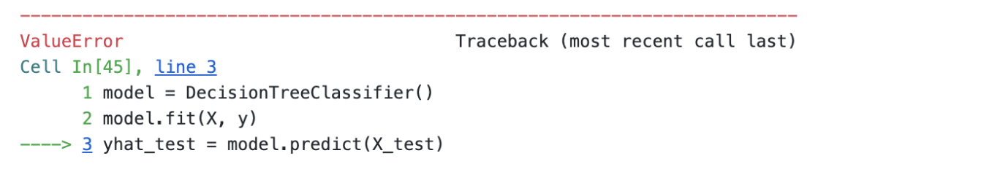

---

Let’s look into what caused the error.
To debug this, we examine a small portion of the preprocessed data:


In [42]:
pd.get_dummies(df_train[2:4])

,PassengerId,Survived,Pclass,Age,SibSp,Parch,Fare,"Name_Hansen, Mr. Henrik Juul","Name_Tikkanen, Mr. Juho",Sex_male,Ticket_350025,Ticket_STON/O 2. 3101293,Embarked_S
382,383,0,3,32.0,0,0,7.9250,False,True,True,False,True,True
704,705,0,3,26.0,1,0,7.8542,True,False,True,True,False,True


Did you catch the issue? Look closely — the Name column has been one-hot encoded into columns like:

- Name_Hansen, Mr. Henrik Juul
- Name_Tikkanen, Mr. Juho

Now, here’s the problem: these exact names appear only in the training set.
They don’t exist in the test set, so when we apply the same code to `df_test`, those columns are missing — which causes a mismatch in the number of features between training and test data.



---

Let’s look at the result of our preprocessing:

In [43]:
X = pd.get_dummies(df_train[features])
X_test = pd.get_dummies(df_test[features])
len(X.columns), len(X_test.columns)

(1398, 401)

See the problem?
The training set ended up with 1398 columns, while the test set has only 401 columns.
This is because the `get_dummies()` function creates columns based on the unique values present in each dataset. For example, if a name or ticket appears only in the training set, `get_dummies()` will create a column for it — but that column will be missing in the test set, leading to a mismatch. As a result, the model cannot be trained and tested on data with different structures, which is why the error occurs.
To fix this, we’ll need to ensure that both `X` and `X_test` have the same columns.

---

Now, we’ll select the features to use as follows:

In [44]:
features = ["PassengerId", "Pclass", "Sex", "Age", "SibSp", "Parch", "Fare", "Embarked"]

The excluded features are Name, Ticket, and Cabin. These columns typically contain highly unique or overly specific values.
If we apply `get_dummies()` to them, the resulting feature sets in the training and test data may end up with mismatched columns.
This mismatch would cause errors during model training or prediction, so we exclude them.

Now let’s apply one-hot encoding using the code below:

In [45]:
X = pd.get_dummies(df_train[features])
X_test = pd.get_dummies(df_test[features])
len(X.columns), len(X_test.columns)

(11, 11)

As you can see, both datasets now have exactly 11 columns.
With the data properly aligned, we’re finally ready to train the model!

---

Now it’s time to apply a machine learning model.

In [46]:
#| eval: false
model = DecisionTreeClassifier(random_state=0)
model.fit(X, y)
yhat_test = model.predict(X_test)
(y_test == yhat_test).mean()

0.731844

The result is in — the model yields an accuracy of 0.73. But the outcome feels disappointing. Despite considering all available variables, the model fails to outperform the following simple rule:

In [47]:
(y_test == (df_test['Sex']=="female")).mean()

0.782123

Just predicting survival for all female passengers results in a higher accuracy.

---

Why did this happen?

It reminds us of an earlier observation: adding more variables to the model doesn’t always lead to better performance, especially when we started from the “Sex” variable alone.

In [48]:
features

['PassengerId', 'Pclass', 'Sex', 'Age', 'SibSp', 'Parch', 'Fare', 'Embarked']

Let’s take a closer look at the current set of features.

Some splits in the decision tree may be unnecessary and harm generalization.
Is there any variable we can reasonably remove?

One variable that stands out is PassengerId. This is merely an identifier — it doesn’t carry any semantic meaning related to survival.
Would it make sense to create a rule like: “If PassengerId > 600, then the passenger survived”?
That clearly makes no logical sense and would likely not generalize beyond this dataset.

Therefore, it’s reasonable to remove the PassengerId feature before retraining the model.

---

We revised the feature list to exclude PassengerId and focused on more meaningful variables:

In [49]:
features = ["Pclass", "Sex", "Age", "SibSp", "Parch", "Fare", "Embarked"]
X = pd.get_dummies(df_train[features])
X_test = pd.get_dummies(df_test[features])
model = DecisionTreeClassifier(random_state=0)
model.fit(X, y)
yhat_test = model.predict(X_test)
(y_test == yhat_test).mean()

0.804469

The result?

> 0.804469!!

Finally, we achieved a decent-performing model. Removing the irrelevant PassengerId feature appears to have improved generalization and accuracy.

## AutoML

Traditional machine learning comes with several limitations:

- You need to study and understand the model before using it.
- You must carefully transform the data into a suitable format.
- Honestly, wouldn’t it be great if someone else just analyzed everything for us?

Let’s take a look at AutoML. 

---

AutoML stands for Automated Machine Learning.
It refers to the process of automating the end-to-end pipeline of building a machine learning model. This includes:

- Preprocessing the data
- Selecting and tuning models
- Evaluating performance
- Making final predictions

AutoML is designed to make machine learning accessible, efficient, and robust, even for those without deep expertise.


---

There are several well-known AutoML tools available today:

- Google AutoML (Cloud-based, integrates with Google Cloud services)
- Auto-sklearn (based on scikit-learn, focuses on pipelines)
- H2O AutoML (supports both ML and deep learning)
- AutoGluon (from Amazon, designed for ease and flexibility)

---

In this course, we’ll use AutoGluon, a powerful AutoML framework developed by Amazon.

AutoGluon is:

- Easy to use with minimal code
- Well-suited for tabular data
- Capable of trying many models and combining them automatically
- Surprisingly accurate even without manual tuning

It’s a great tool for quickly building high-quality models — and ideal for learners who want to focus on insights rather than low-level implementation.

---

Prediction with AutoGluon begins with the following line of code:

In [50]:
predictor = TabularPredictor("Survived")

No path specified. Models will be saved in: "AutogluonModels/ag-20251103_124336"


What does TabularPredictor mean?

The term "tabular" refers to data organized in rows and columns — like spreadsheets or pandas DataFrames. This format is typical for structured datasets such as Titanic passenger records.

Unlike traditional approaches where a single model (e.g., decision tree) is manually selected, AutoGluon automatically trains and compares a variety of powerful algorithms — such as gradient boosting, random forests, and neural networks.
It then selects or combines the top-performing ones to generate robust predictions.

In short, TabularPredictor manages the entire process for tabular datasets — from training multiple models to picking the most effective strategy — with minimal code required.

---

The next step is to train the model using AutoGluon:

In [51]:
predictor.fit(df_train)

Verbosity: 2 (Standard Logging)
=================== System Info ===================
AutoGluon Version:  1.3.1
Python Version:     3.11.13
Operating System:   Linux
Platform Machine:   x86_64
Platform Version:   #33~24.04.1-Ubuntu SMP PREEMPT_DYNAMIC Fri Sep 19 17:02:30 UTC 2
CPU Count:          16
Memory Avail:       120.61 GB / 125.71 GB (95.9%)
Disk Space Avail:   201.34 GB / 457.38 GB (44.0%)
No presets specified! To achieve strong results with AutoGluon, it is recommended to use the available presets. Defaulting to `'medium'`...
	Recommended Presets (For more details refer to https://auto.gluon.ai/stable/tutorials/tabular/tabular-essentials.html#presets):
	presets='experimental' : New in v1.2: Pre-trained foundation model + parallel fits. The absolute best accuracy without consideration for inference speed. Does not support GPU.
	presets='best'         : Maximize accuracy. Recommended for most users. Use in competitions and benchmarks.
	presets='high'         : Strong accuracy with

What makes this step powerful is its simplicity.

You don’t need to perform any manual preprocessing — AutoGluon automatically detects categorical variables and applies one-hot encoding or other suitable transformations for you.

Moreover, you don’t even need to drop potentially problematic columns like "Name" or "Ticket" — AutoGluon handles them gracefully without breaking the model.
It’s incredibly convenient.

Running this single line of code is essentially equivalent to performing multiple rounds of `model.fit(...)` using different algorithms, hyperparameter settings, and preprocessing strategies — all done automatically.

It’s like launching an entire machine learning pipeline with just one command.

---

Let’s take a look at the model leaderboard results:

In [52]:
predictor.leaderboard()

,model,score_val,eval_metric,pred_time_val,fit_time,pred_time_val_marginal,fit_time_marginal,stack_level,can_infer,fit_order
0,LightGBMXT,0.839161,accuracy,0.001683,0.361428,0.001683,0.361428,1,True,3
1,WeightedEnsemble_L2,0.839161,accuracy,0.002179,0.426323,0.000496,0.064895,2,True,14
2,LightGBM,0.832168,accuracy,0.001752,0.196912,0.001752,0.196912,1,True,4
3,NeuralNetTorch,0.832168,accuracy,0.008308,3.860216,0.008308,3.860216,1,True,12
4,XGBoost,0.825175,accuracy,0.003324,0.246637,0.003324,0.246637,1,True,11
5,LightGBMLarge,0.818182,accuracy,0.001849,0.476456,0.001849,0.476456,1,True,13
6,CatBoost,0.818182,accuracy,0.002558,0.542075,0.002558,0.542075,1,True,7
7,ExtraTreesEntr,0.818182,accuracy,0.209955,0.583069,0.209955,0.583069,1,True,9
8,NeuralNetFastAI,0.811189,accuracy,0.009792,0.916195,0.009792,0.916195,1,True,10
9,ExtraTreesGini,0.804196,accuracy,0.105650,0.625215,0.105650,0.625215,1,True,8


---

At the top of the leaderboard, we see models like:

- LightGBMXT, LightGBM, XGBoost, CatBoost, LightGBMLarge, ExtraTreesEntr, ExtraTreesGini, RandomForestEntr, RandomForestGini

These are all tree-based models — an evolution of decision tree algorithms. They combine multiple decision trees to improve prediction performance and reduce overfitting. In the domain of tabular data, tree-based models (especially gradient boosting methods) are widely regarded as the state-of-the-art (SOTA). They:

- Handle missing values and mixed data types well
- Capture non-linear patterns without requiring complex preprocessing
- Often outperform deep learning models on structured datasets

That’s why we consistently see tree-based models dominating AutoML leaderboards — they are fast, accurate, and robust for most practical applications in tabular data analysis.

---

Now let’s check the final prediction result:

In [53]:
(y_test == predictor.predict(df_test)).mean()

0.804469

Even though we didn’t perform any manual preprocessing on the variables,
AutoGluon ran without errors and produced a respectable accuracy of 0.804469.

That’s a strong result — especially considering the minimal effort required.

---

This time, we apply a bit of preprocessing by removing a few variables.
We simply exclude PassengerId, Ticket, and Cabin, and retrain the model.

In [54]:
df_train_preprocessed = df_train.drop(['PassengerId','Ticket','Cabin'],axis=1)
df_test_preprocessed = df_test.drop(['PassengerId','Ticket','Cabin'],axis=1)
predictor = TabularPredictor("Survived")
predictor.fit(df_train_preprocessed)
yhat_test = predictor.predict(df_test_preprocessed)
(y_test == yhat_test).mean()

No path specified. Models will be saved in: "AutogluonModels/ag-20251103_124350"
Verbosity: 2 (Standard Logging)
=================== System Info ===================
AutoGluon Version:  1.3.1
Python Version:     3.11.13
Operating System:   Linux
Platform Machine:   x86_64
Platform Version:   #33~24.04.1-Ubuntu SMP PREEMPT_DYNAMIC Fri Sep 19 17:02:30 UTC 2
CPU Count:          16
Memory Avail:       119.91 GB / 125.71 GB (95.4%)
Disk Space Avail:   201.26 GB / 457.38 GB (44.0%)
No presets specified! To achieve strong results with AutoGluon, it is recommended to use the available presets. Defaulting to `'medium'`...
	Recommended Presets (For more details refer to https://auto.gluon.ai/stable/tutorials/tabular/tabular-essentials.html#presets):
	presets='experimental' : New in v1.2: Pre-trained foundation model + parallel fits. The absolute best accuracy without consideration for inference speed. Does not support GPU.
	presets='best'         : Maximize accuracy. Recommended for most users. U

0.810056

The result is 0.810056. This is the best performance among all the models we’ve used so far. Even with the removal of just a few columns, we observe a noticeable improvement in predictive performance.

---

Has anyone here wondered something like this?

> “Why didn’t we drop the ‘Name’ column? Was it just a mistake?”

Actually, it wasn’t a mistake at all.

Do you remember the final scene of the movie Titanic? When Rose is asked for her name, she replies with a different last name. That moment isn’t just about identity—it’s a statement of her choices and transformation. In the same way, a person’s name in data isn’t just a label. It often carries hidden signals about age, gender, and social status.


---


AutoGluon understands this. It doesn’t treat the Name column as a meaningless string. Instead, without any manual feature engineering, it applies simple natural language processing techniques under the hood to extract valuable features.

For example, look at the following:

In [55]:
df_test[:5]

,PassengerId,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
709,710,3,"Moubarek, Master. Halim Gonios (""William George"")",male,NaN,1,1,2661,15.2458,NaN,C
439,440,2,"Kvillner, Mr. Johan Henrik Johannesson",male,31.0,0,0,C.A. 18723,10.5000,NaN,S
840,841,3,"Alhomaki, Mr. Ilmari Rudolf",male,20.0,0,0,SOTON/O2 3101287,7.9250,NaN,S
720,721,2,"Harper, Miss. Annie Jessie ""Nina""",female,6.0,0,1,248727,33.0000,NaN,S
39,40,3,"Nicola-Yarred, Miss. Jamila",female,14.0,1,0,2651,11.2417,NaN,C


When I saw the first observation, I predicted that the passenger would survive. Why? Because their name contained the word “Master”, which usually refers to young boys—typically under the age of 10. And as we know, young children had a much higher chance of survival.

In [ ]:
11